In [17]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
%matplotlib inline

In [18]:
m = scipy.io.loadmat('CLASubjectA1601083StLRHand.mat', struct_as_record=True)
print(m.keys())

dict_keys(['__header__', '__version__', '__globals__', 'o'])


In [19]:
EEG = m['o']['data'][0][0].T
list_markers = [s[0] for s in m['o']['marker'][0][0]]
labels = np.asarray(list_markers)

sample_rate = m['o']['sampFreq'][0][0][0][0]
# Loading channel names
channel_names = [s[0][0] for s in m['o']['chnames'][0][0]]
nchannels, nsamples = EEG.shape
list_markers = [s[0] for s in m['o']['marker'][0][0]]
unique_events = np.unique(list_markers)

print("EEG Dimensions: ", EEG.shape)
print("Label Dimensions: ", labels.shape)
print("Sample Rate:", sample_rate)
print("Number of channels:", nchannels)
print("Channel names:", channel_names)
print("Event codes:", unique_events)


EEG Dimensions:  (22, 671600)
Label Dimensions:  (671600,)
Sample Rate: 200
Number of channels: 22
Channel names: ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'A1', 'A2', 'F7', 'F8', 'T3', 'T4', 'T5', 'T6', 'Fz', 'Cz', 'Pz', 'X5']
Event codes: [0 1 2 3]


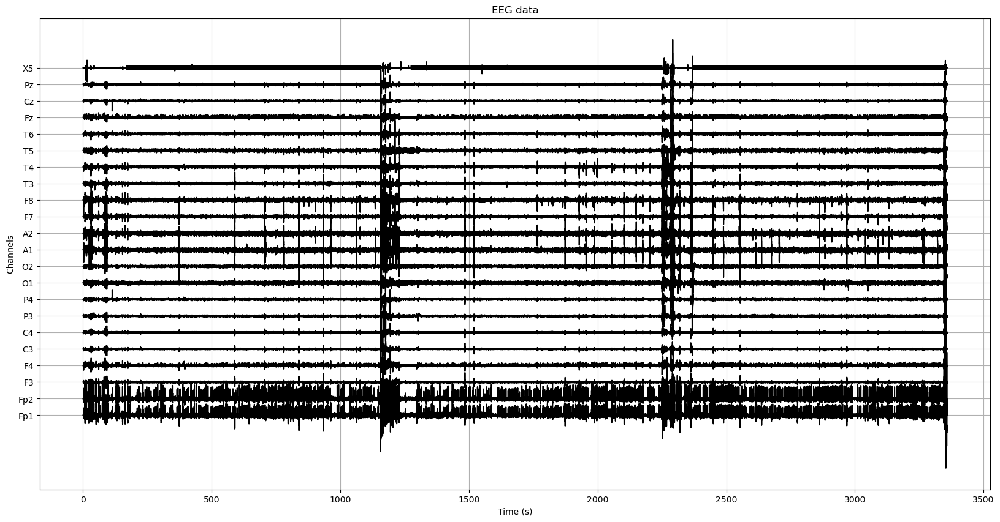

In [20]:
from matplotlib.collections import LineCollection

def plot_eeg(EEG, vspace=200, color='k'):
    '''
    Plot the EEG data, stacking the channels horizontally on top of each other.

    Parameters
    ----------
    EEG : array (channels x samples)
        The EEG data
    vspace : float (default 100)
        Amount of vertical space to put between the channels
    color : string (default 'k')
        Color to draw the EEG in
    '''
    
    bases = vspace * np.arange(22)
    
    EEG = EEG.T + bases
    
    # Calculate a timeline in seconds, knowing that the sample rate of the EEG recorder was 200 Hz.
    samplerate = 200.
    time = np.arange(EEG.shape[0]) / samplerate
    
    # Plot EEG versus time
    plt.plot(time, EEG, color=color)

    # Add gridlines to the plot
    plt.grid()
    
    # Label the axes
    plt.xlabel('Time (s)')
    plt.ylabel('Channels')
    
    # The y-ticks are set to the locations of the electrodes. The international 10-20 system defines
    # default names for them.
    plt.gca().yaxis.set_ticks(bases)
    plt.gca().yaxis.set_ticklabels(channel_names)
    
    # Put a nice title on top of the plot
    plt.title('EEG data')


# Testing our function
plt.figure(figsize=(20, 10))
plot_eeg(EEG)

In [21]:
labels.shape

(671600,)

In [22]:
non_zero_i = np.flatnonzero(labels)
non_zero_i

array([ 37272,  37273,  37274, ..., 668645, 668646, 668647], dtype=int64)

In [23]:
onsets = [non_zero_i[0]]
for i in range(1, len(non_zero_i)):
    if non_zero_i[i - 1] != non_zero_i[i] - 1:
        onsets.append(non_zero_i[i])
onsets = np.asarray(onsets)
onsets

array([ 37272,  37783,  38370,  39022,  39555,  40111,  40695,  41278,
        41815,  42342,  43001,  43656,  44330,  44895,  45506,  46177,
        46795,  47436,  48033,  48646,  49303,  49855,  50370,  50994,
        51696,  52283,  52895,  53444,  53967,  54622,  55195,  55809,
        56491,  57107,  57737,  58389,  59060,  59648,  60311,  60963,
        61516,  62069,  62633,  63147,  63683,  64221,  64929,  65444,
        66028,  66580,  67224,  67818,  68324,  68991,  69681,  70355,
        71017,  71569,  72190,  72753,  73431,  74133,  74804,  75359,
        75944,  76610,  77278,  77852,  78472,  79125,  79708,  80405,
        81082,  81713,  82411,  83016,  83537,  84219,  84882,  85510,
        86105,  86649,  87253,  87918,  88455,  89100,  89799,  90433,
        91016,  91718,  92408,  93010,  93694,  94280,  94863,  95547,
        96184,  96699,  97320,  97972,  98579,  99276,  99787, 100396,
       101082, 101631, 102200, 102836, 103394, 104074, 104730, 105394,
      

In [24]:
plt.figure(figsize=(300, 100))
plot_eeg(EEG, 400)
for onset in onsets:
    plt.axvline(onset / 200., color='r')


In [25]:
# Creating time slices with a window of 0.85 secs
time_slices = [(s, int(s + 0.85 * 200)) for s in onsets]
print("First 10 trials are:")
time_slices[:10] # Showing 10 trial onsets and ending times

First 10 trials are:


[(37272, 37442),
 (37783, 37953),
 (38370, 38540),
 (39022, 39192),
 (39555, 39725),
 (40111, 40281),
 (40695, 40865),
 (41278, 41448),
 (41815, 41985),
 (42342, 42512)]

Shape of trial one: (22, 170)


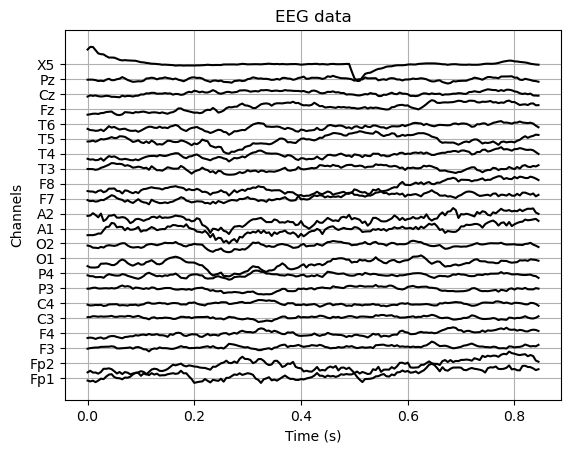

In [26]:
# Printing details of a single trial with 170 frames (0.85 secs at 200Hz)
trial_one = EEG[:, time_slices[0][0]:time_slices[0][1]]
print("Shape of trial one:", trial_one.shape)
plot_eeg(trial_one, 20)